<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">📚ACADEMIC SUCCESS CLASSSIFICATION📚</div>

![](https://www.faithonview.com/wp-content/uploads/2022/02/college-diploma-hat-publicdomainvectors-scaled-1-1024x392.jpg)

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 📂IMPORTING LIBRARIES📂 </div>

In [1]:
import statsmodels.api as sm
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import numpy as np 
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,AdaBoostClassifier,VotingClassifier,HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score,r2_score,recall_score,roc_auc_score,confusion_matrix,classification_report
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import lightgbm as lgb
import warnings
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.exceptions import DataConversionWarning
from catboost import CatBoostClassifier,Pool
from catboost.utils import eval_metric
warnings.filterwarnings("ignore", category=DataConversionWarning)
warnings.filterwarnings("ignore")
from IPython.display import display, HTML
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import cross_val_score
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from scipy.stats import ttest_ind,chi2_contingency
from sklearn.naive_bayes import GaussianNB
from sklearn.utils import class_weight

import pandas as pd 
from sklearn.preprocessing import PowerTransformer, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from scipy.stats import skew
from sklearn.model_selection import train_test_split
import seaborn as sns
from matplotlib import pyplot as plt
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/playground-series-s4e6/sample_submission.csv
/kaggle/input/playground-series-s4e6/train.csv
/kaggle/input/playground-series-s4e6/test.csv
/kaggle/input/xgboostsubmission/XGBoost.csv


<div class="alert alert-block alert-success" style="margin: 20px; padding: 20px; border-radius: 10px; border: 2px solid #4CAF50; background-color: #E6F7E2;">
    <b>📂 Libraries:</b> Successfully import the recquired library
</div>


In [2]:
rc = {
    "axes.facecolor": "#F8F8F8",
    "figure.facecolor": "#F8F8F8",
    "axes.edgecolor": "#000000",
    "grid.color": "#EBEBE7" + "30",
    "font.family": "serif",
    "axes.labelcolor": "#000000",
    "xtick.color": "#000000",
    "ytick.color": "#000000",
    "grid.alpha": 0.4,
}

sns.set(rc=rc)
palette = ['#302c36', '#037d97', '#E4591E', '#C09741',
           '#EC5B6D', '#90A6B1', '#6ca957', '#D8E3E2']

from colorama import Style, Fore
blk = Style.BRIGHT + Fore.BLACK
mgt = Style.BRIGHT + Fore.MAGENTA
red = Style.BRIGHT + Fore.RED
blu = Style.BRIGHT + Fore.BLUE
res = Style.RESET_ALL

plt.style.use('fivethirtyeight')

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 📜READING THE FILE📜</div>

In [3]:
train = pd.read_csv("/kaggle/input/playground-series-s4e6/train.csv")
test = pd.read_csv("/kaggle/input/playground-series-s4e6/test.csv")

<div class="alert alert-block alert-success" style="margin: 20px; padding: 20px; border-radius: 10px; border: 2px solid #4CAF50; background-color: #E6F7E2;">
    <b>📂 DataSet:</b> Successfully read the dataset 
</div>


<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 📜SAMPLE OF TRAIN-TEST DATA📜 </div>

In [4]:
train.sample(5).style.background_gradient()

,id,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
8131,8131,1,43,1,9070,1,1,117.000000,1,1,1,3,3,110.000000,1,0,0,1,1,0,22,0,0,6,0,0,0.000000,0,0,6,0,0,0.000000,0,16.200000,0.300000,-0.920000,Dropout
40911,40911,1,42,1,9085,1,1,120.000000,1,19,3,9,2,128.200000,0,0,1,1,0,0,31,0,4,10,21,4,12.250000,3,2,8,20,2,12.500000,3,9.400000,-0.800000,-3.120000,Dropout
27604,27604,1,1,1,9500,1,1,148.000000,1,19,1,4,10,137.500000,0,0,0,1,0,0,18,0,0,7,8,7,14.842857,0,0,8,8,7,14.388889,0,15.500000,2.800000,-4.060000,Graduate
47962,47962,1,53,1,9003,1,42,150.000000,1,3,3,2,2,150.000000,0,0,0,1,1,0,23,0,5,9,15,9,13.222222,0,4,9,14,5,12.600000,0,8.900000,1.400000,3.510000,Graduate
62608,62608,1,17,3,9500,1,1,130.000000,1,19,19,3,10,121.300000,1,0,0,1,0,0,20,0,0,7,8,6,13.470000,0,0,8,10,7,13.326250,0,12.400000,0.500000,1.790000,Dropout


In [5]:
test.sample(5).style.background_gradient()

,id,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
50729,127247,1,1,1,9500,1,1,131.000000,1,19,19,9,7,118.100000,0,0,0,1,0,1,18,0,0,7,7,7,13.190000,0,0,8,8,8,14.141250,0,11.100000,0.600000,2.020000
10683,87201,1,1,1,9773,1,1,126.000000,1,1,37,7,7,118.700000,0,0,0,1,0,1,19,0,0,6,6,6,13.333333,0,0,6,6,6,13.500000,0,16.200000,0.300000,-0.920000
26690,103208,1,7,1,9147,1,3,140.000000,1,37,37,5,7,140.000000,0,0,0,1,0,0,36,0,0,5,5,0,0.000000,0,0,5,5,5,14.600000,0,16.200000,0.300000,-0.920000
32155,108673,1,1,6,9500,1,1,140.000000,1,38,37,9,9,131.500000,1,0,0,1,0,0,18,0,0,8,8,7,12.944286,0,0,8,8,7,12.944286,0,10.800000,1.400000,1.740000
36229,112747,1,1,1,9238,1,1,164.000000,1,1,19,9,9,149.000000,0,0,0,1,0,1,19,0,0,6,6,6,12.666667,0,0,6,6,6,12.833333,0,10.800000,1.400000,1.740000


<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 🔍INFORMATION ABOUT TRAIN DATA🔍</div>

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76518 entries, 0 to 76517
Data columns (total 38 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   id                                              76518 non-null  int64  
 1   Marital status                                  76518 non-null  int64  
 2   Application mode                                76518 non-null  int64  
 3   Application order                               76518 non-null  int64  
 4   Course                                          76518 non-null  int64  
 5   Daytime/evening attendance                      76518 non-null  int64  
 6   Previous qualification                          76518 non-null  int64  
 7   Previous qualification (grade)                  76518 non-null  float64
 8   Nacionality                                     76518 non-null  int64  
 9   Mother's qualification                 

<div class="alert alert-block alert-success" style="margin: 20px; padding: 20px; border-radius: 10px; border: 2px solid #4CAF50; background-color: skyblue;">
<b>🔍 Information:</b> 
    
1. 38 columns in train data.
    
    
2. Many of them are int data type, many are float datatype, and many are object datatype
</div>

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 📚TRAIN-TEST DESCRIPTION📚</div>

In [7]:
train.describe().T.style.background_gradient()

,count,mean,std,min,25%,50%,75%,max
id,76518.000000,38258.500000,22088.988286,0.000000,19129.250000,38258.500000,57387.750000,76517.000000
Marital status,76518.000000,1.111934,0.441669,1.000000,1.000000,1.000000,1.000000,6.000000
Application mode,76518.000000,16.054419,16.682337,1.000000,1.000000,17.000000,39.000000,53.000000
Application order,76518.000000,1.644410,1.229645,0.000000,1.000000,1.000000,2.000000,9.000000
Course,76518.000000,9001.286377,1803.438531,33.000000,9119.000000,9254.000000,9670.000000,9991.000000
Daytime/evening attendance,76518.000000,0.915314,0.278416,0.000000,1.000000,1.000000,1.000000,1.000000
Previous qualification,76518.000000,3.658760,8.623774,1.000000,1.000000,1.000000,1.000000,43.000000
Previous qualification (grade),76518.000000,132.378766,10.995328,95.000000,125.000000,133.100000,140.000000,190.000000
Nacionality,76518.000000,1.226600,3.392183,1.000000,1.000000,1.000000,1.000000,109.000000
Mother's qualification,76518.000000,19.837633,15.399456,1.000000,1.000000,19.000000,37.000000,44.000000


In [8]:
test.describe().T.style.background_gradient()

,count,mean,std,min,25%,50%,75%,max
id,51012.000000,102023.500000,14726.040303,76518.000000,89270.750000,102023.500000,114776.250000,127529.000000
Marital status,51012.000000,1.109092,0.438084,1.000000,1.000000,1.000000,1.000000,6.000000
Application mode,51012.000000,16.067102,16.654196,1.000000,1.000000,17.000000,39.000000,53.000000
Application order,51012.000000,1.648161,1.235666,0.000000,1.000000,1.000000,2.000000,9.000000
Course,51012.000000,9026.304556,1751.328311,33.000000,9119.000000,9254.000000,9670.000000,9991.000000
Daytime/evening attendance,51012.000000,0.918313,0.273889,0.000000,1.000000,1.000000,1.000000,1.000000
Previous qualification,51012.000000,3.635007,8.577250,1.000000,1.000000,1.000000,1.000000,43.000000
Previous qualification (grade),51012.000000,132.328001,10.885679,95.000000,125.000000,133.100000,139.000000,190.000000
Nacionality,51012.000000,1.200090,3.264730,1.000000,1.000000,1.000000,1.000000,109.000000
Mother's qualification,51012.000000,19.913275,15.383823,1.000000,1.000000,19.000000,37.000000,44.000000


<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff;padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 🔍CHECKING NULL DATA🔍</div>

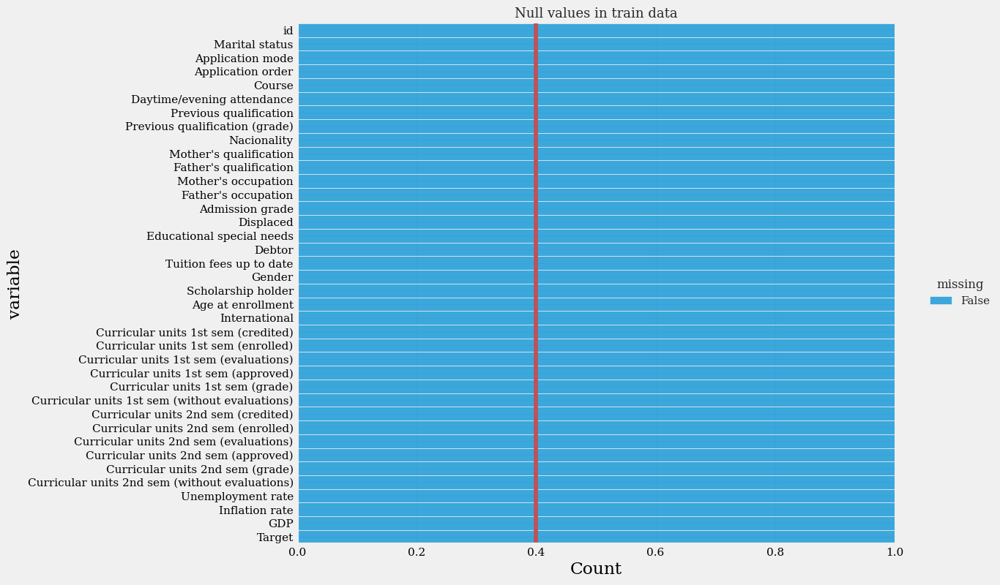

In [9]:
sns.displot(data=train.isnull().melt(value_name = 'missing'),
           y = 'variable',
           hue = 'missing',multiple='fill',height=8,aspect = 1.6)
plt.axvline(0.4,color = 'r')
plt.title("Null values in train data",fontsize = 13)
plt.show()

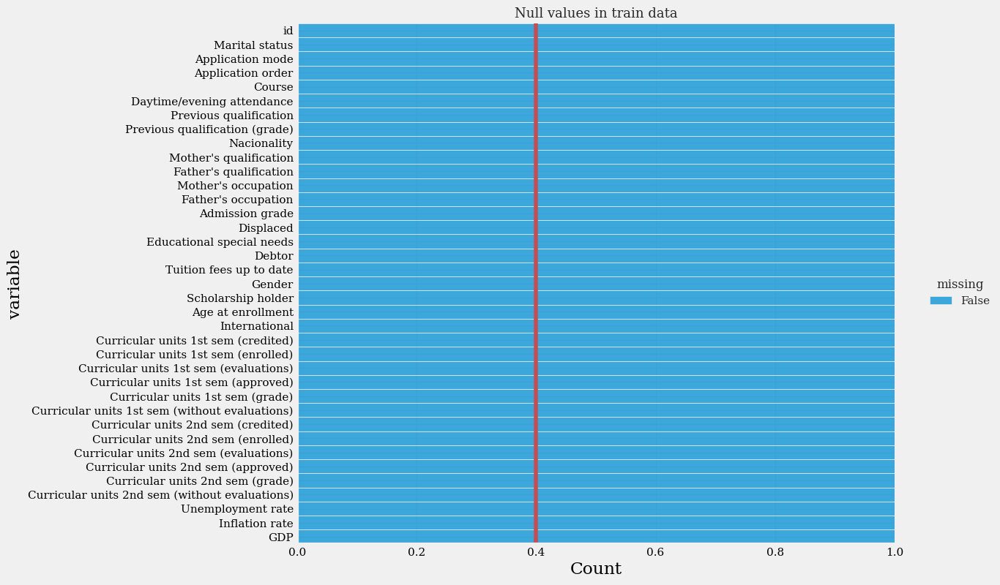

In [10]:
sns.displot(data=test.isnull().melt(value_name = 'missing'),
           y = 'variable',
           hue = 'missing',multiple='fill',height=8,aspect = 1.6)
plt.axvline(0.4,color = 'r')
plt.title("Null values in train data",fontsize = 13)
plt.show()

<div class="alert alert-block alert-success" style="margin: 20px; padding: 20px; border-radius: 10px; border: 2px solid #4CAF50; background-color: skyblue;">
<b>🔍 Information:</b> No null value present in train and test data
</div>


<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff;padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 🔍CHECKING DUPLICATES🔍</div>

In [11]:
train.duplicated().sum()

0

In [12]:
train.columns

Index(['id', 'Marital status', 'Application mode', 'Application order',
       'Course', 'Daytime/evening attendance', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mother's qualification', 'Father's qualification',
       'Mother's occupation', 'Father's occupation', 'Admission grade',
       'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 📉TARGET COLUMN ANALYSIS📈</div>

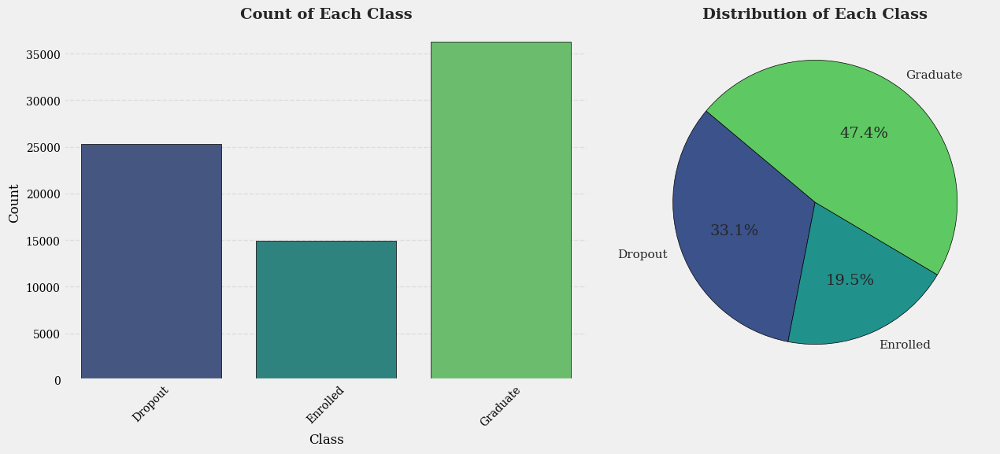

In [13]:
target_column = 'Target'

# Calculate the counts for each class
class_counts = train[target_column].value_counts().sort_index()

# Plotting
plt.figure(figsize=(14, 6))

# Plotting counts for each class with bar plot
plt.subplot(1, 2, 1)
sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis', edgecolor='black')
plt.title('Count of Each Class', fontsize=14, fontweight='bold')
plt.xlabel('Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()

# Plotting counts for each class with pie chart
plt.subplot(1, 2, 2)
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', colors=sns.color_palette('viridis', len(class_counts)), startangle=140, wedgeprops={'edgecolor': 'black'})
plt.title('Distribution of Each Class', fontsize=14, fontweight='bold')
plt.tight_layout()

plt.show()

In [14]:
print("Columns in Target column are:", class_counts)

Columns in Target column are: Target
Dropout     25296
Enrolled    14940
Graduate    36282
Name: count, dtype: int64


In [15]:
unique_counts = train.nunique()
#Threshold to distinguish continous and categorical
threshold = 12
continuous_vars = unique_counts[unique_counts > threshold].index.tolist()
categorical_vars = unique_counts[unique_counts <= threshold].index.tolist()
if 'id' in continuous_vars:
    continuous_vars.remove('id')

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 📉CATEGORICAL COLUMN ANALYSIS💹 </div>

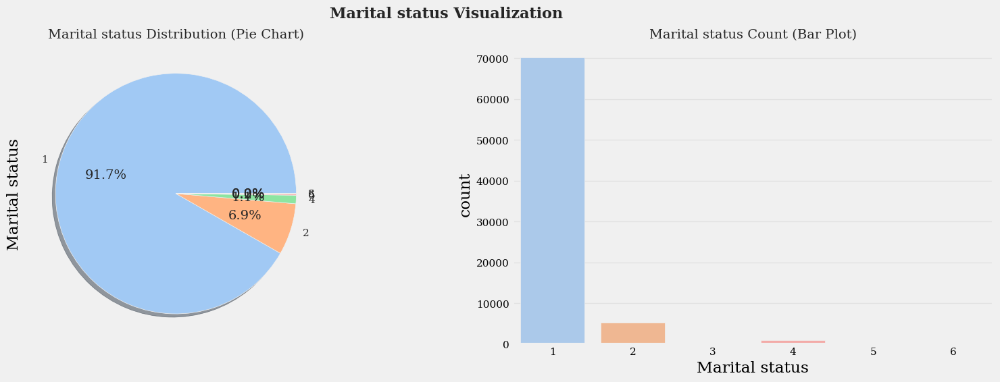

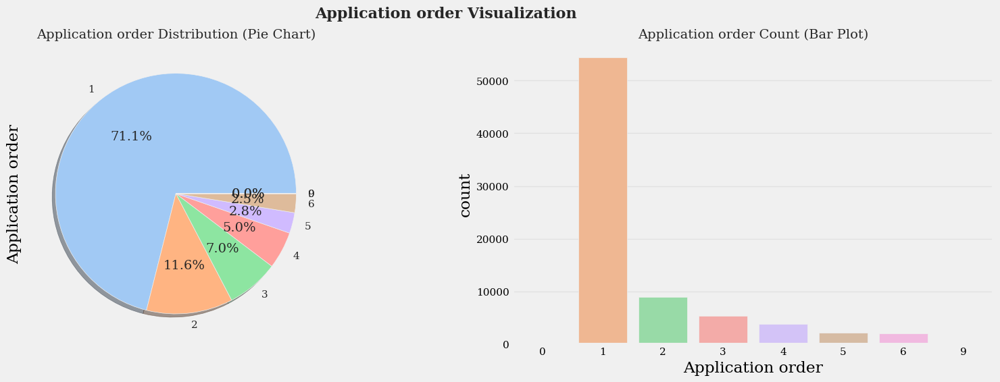

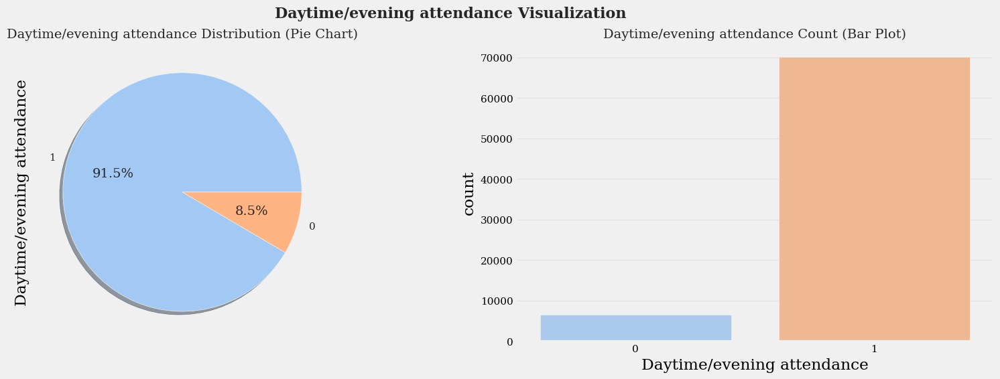

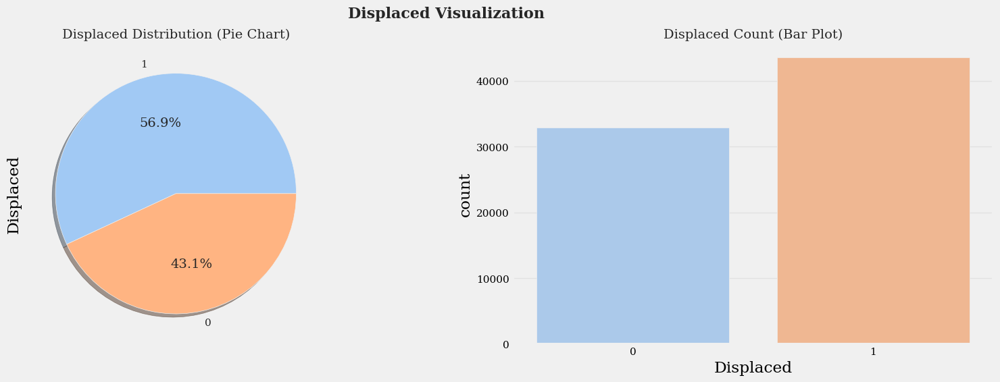

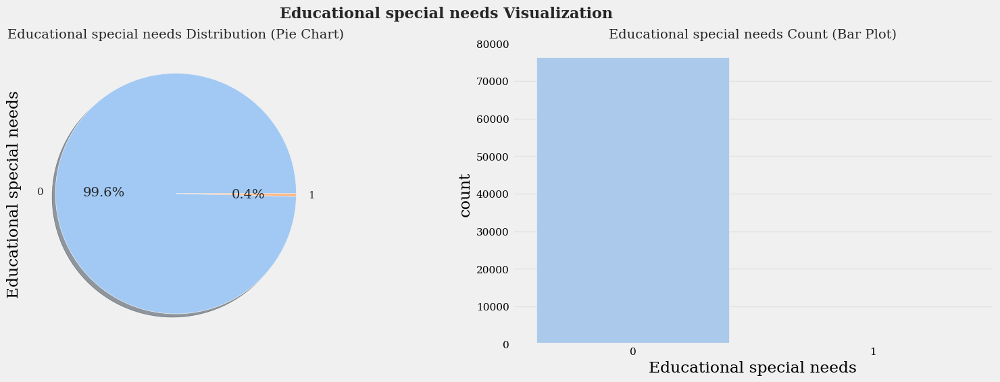

...

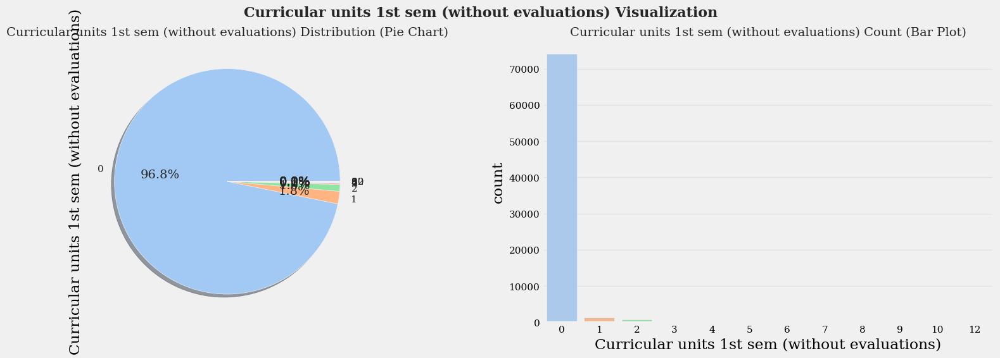

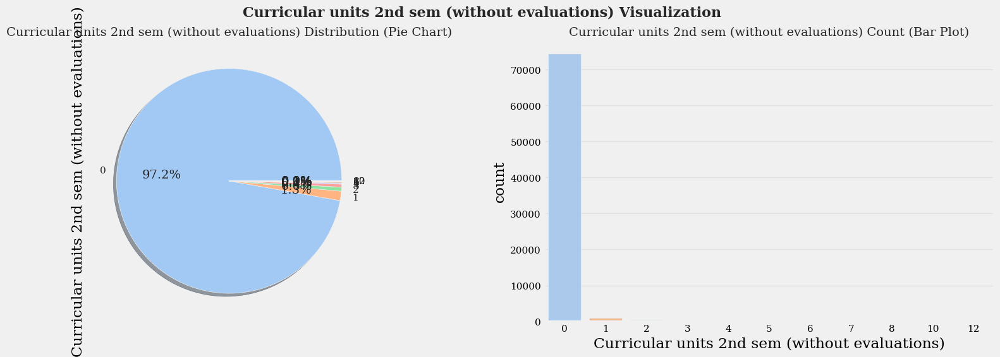

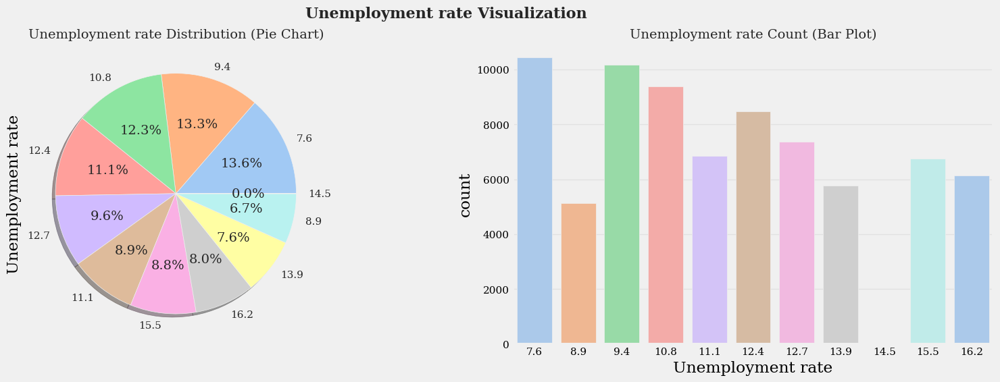

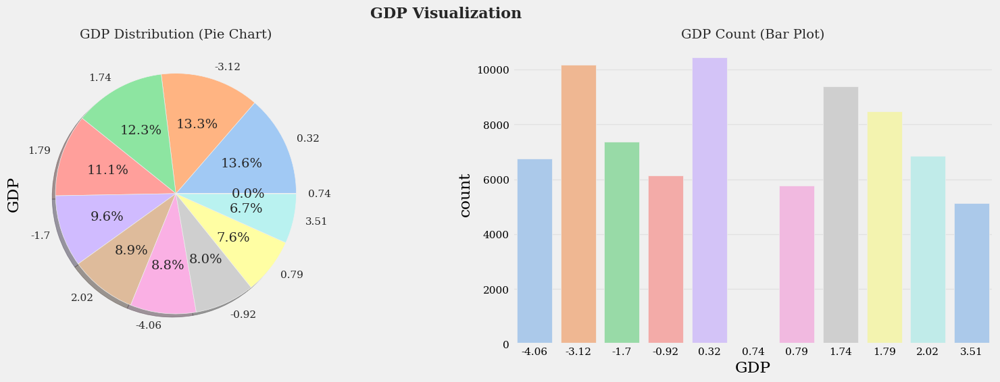

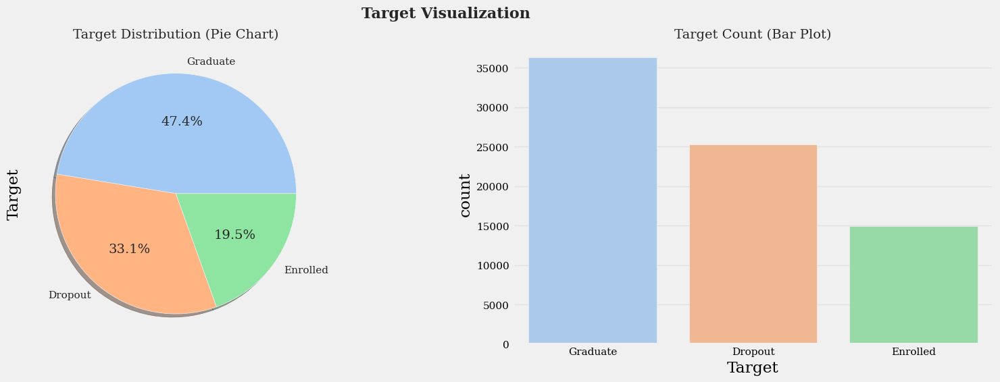

In [16]:
custom_palette = sns.color_palette("pastel")

for column in categorical_vars:
    f, ax = plt.subplots(1, 2, figsize=(18, 5.5))
    train[column].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[0], shadow=True, colors=custom_palette)
    ax[0].set_ylabel(f'{column}')
    sns.countplot(x=column, data=train, ax=ax[1], palette=custom_palette)
    ax[0].set_title(f'{column} Distribution (Pie Chart)', fontsize=14)
    ax[1].set_title(f'{column} Count (Bar Plot)', fontsize=14)
    plt.suptitle(f'{column} Visualization', fontsize=16, fontweight='bold')
    plt.show()

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 📉CONTINUOUS COLUMN ANALYSIS📈 </div>

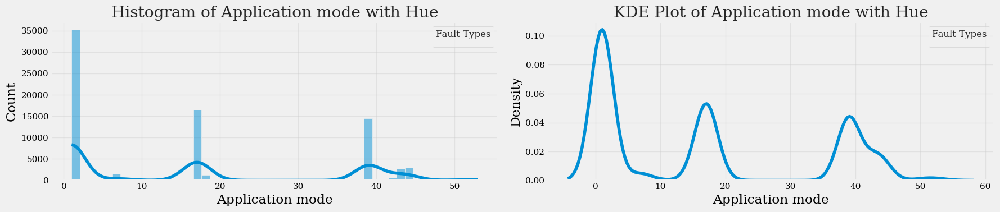

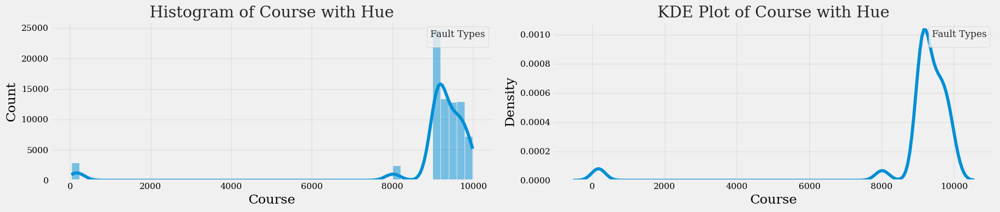

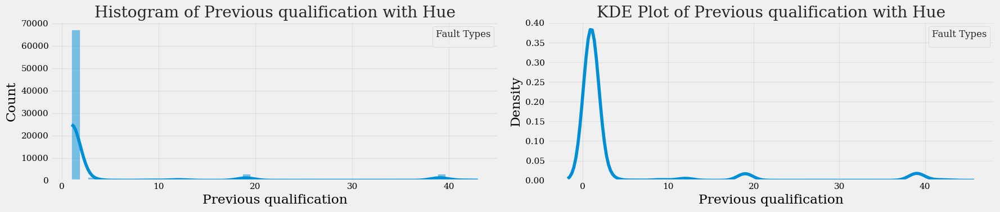

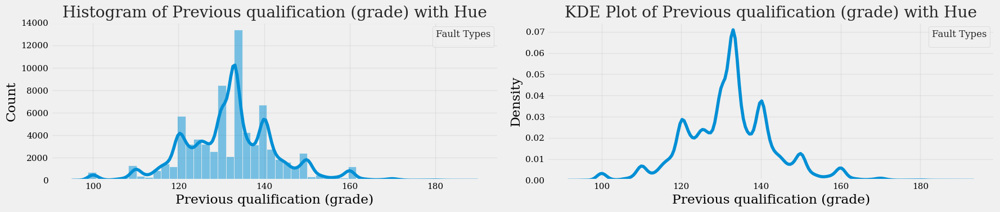

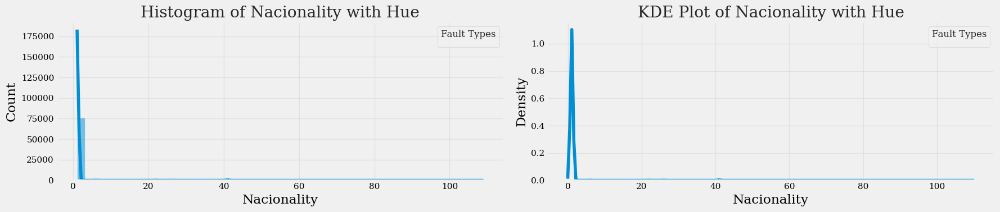

...

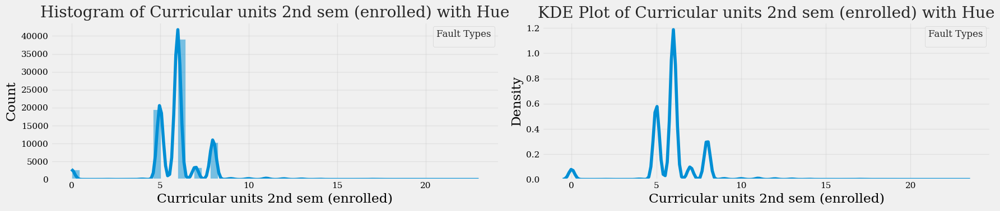

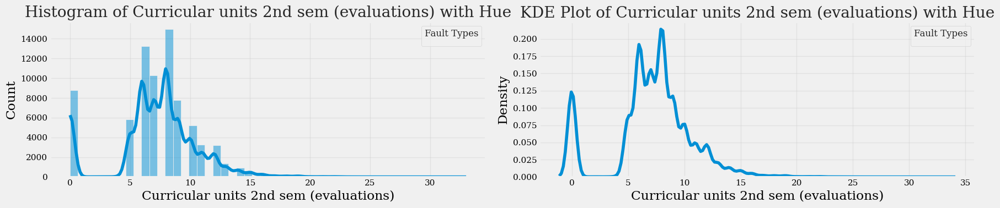

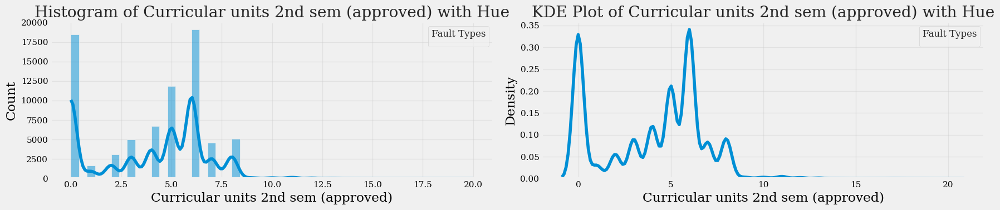

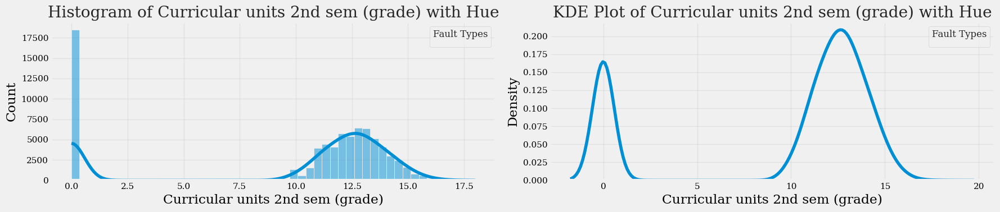

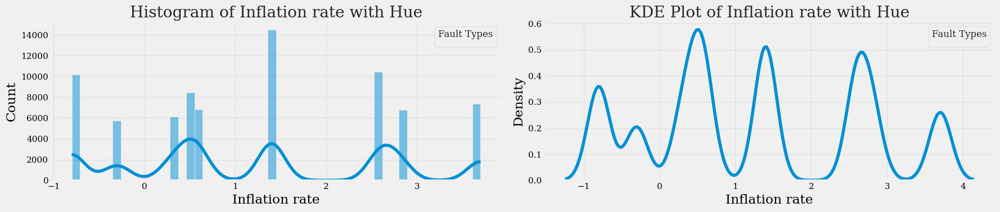

In [17]:
import warnings
warnings.filterwarnings("ignore")
hue_columns = ['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults']
pd.set_option('mode.use_inf_as_na', False)
for column in continuous_vars:
    fig, axes = plt.subplots(1, 2, figsize=(18, 4))  # Create subplots with 1 row and 2 columns
    
    # Plot histogram with hue
    sns.histplot(data=train, x=column, hue_order=hue_columns, bins=50, kde=True, ax=axes[0])
    axes[0].set_title(f'Histogram of {column} with Hue')
    axes[0].set_xlabel(column)
    axes[0].set_ylabel('Count')
    axes[0].legend(title='Fault Types', loc='upper right')
    
    # Plot KDE plot with hue
    sns.kdeplot(data=train, x=column, hue_order=hue_columns, ax=axes[1])
    axes[1].set_title(f'KDE Plot of {column} with Hue')
    axes[1].set_xlabel(column)
    axes[1].set_ylabel('Density')
    axes[1].legend(title='Fault Types', loc='upper right')
    
    plt.tight_layout()  # Adjust spacing between subplots
    plt.show()

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 📈QQ-PLOT ANALYSIS📊</div>

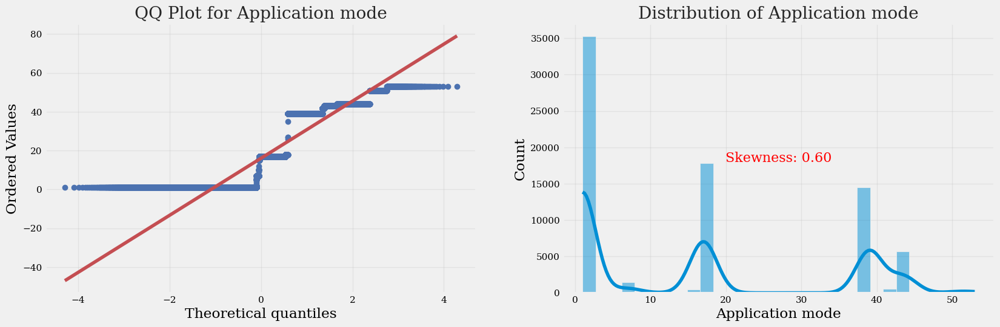

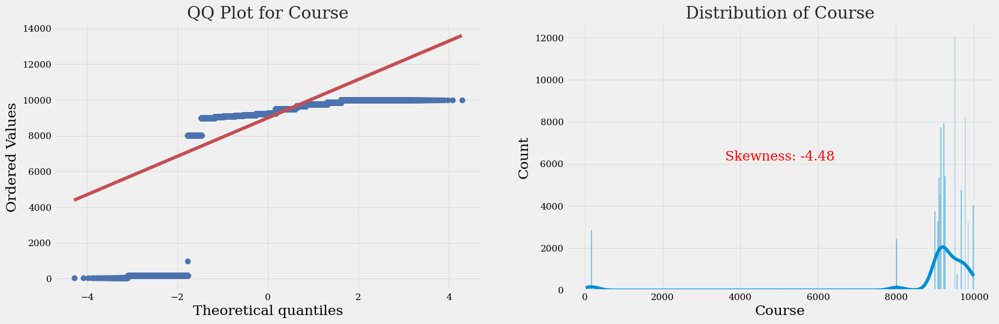

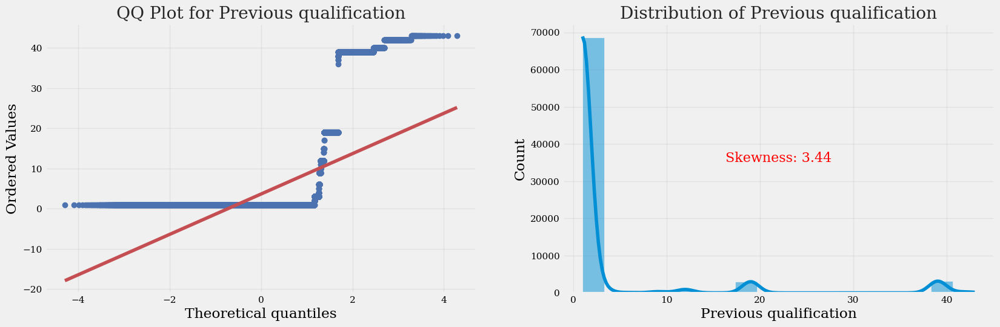

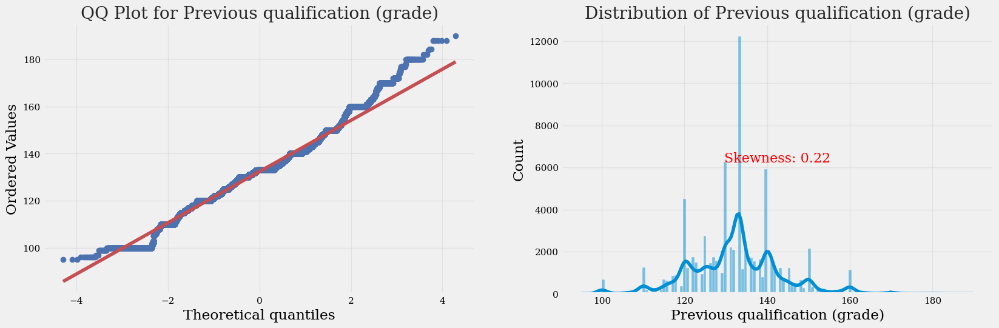

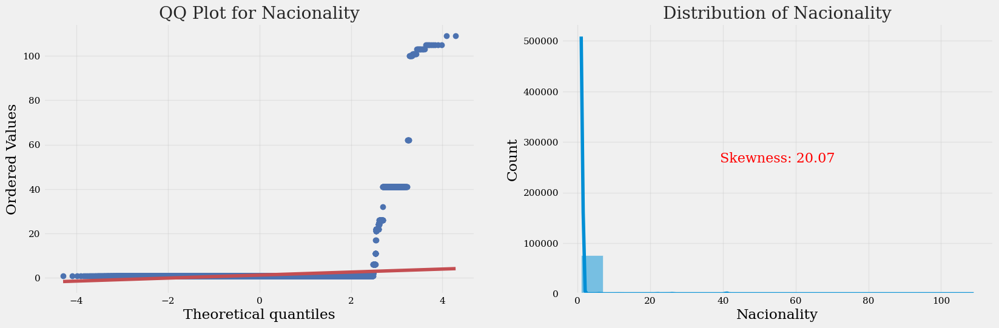

...

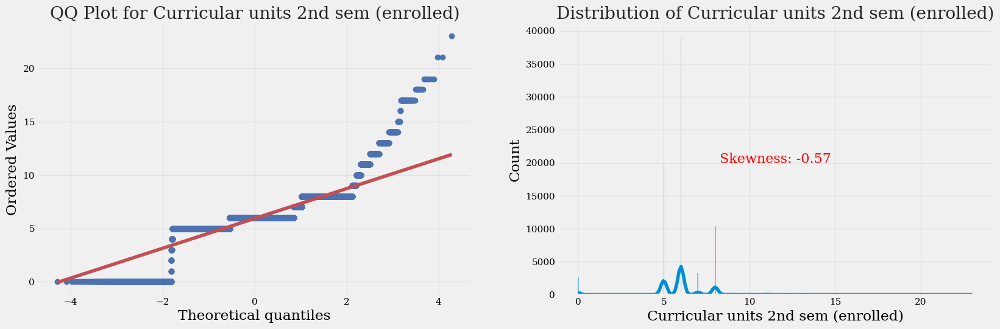

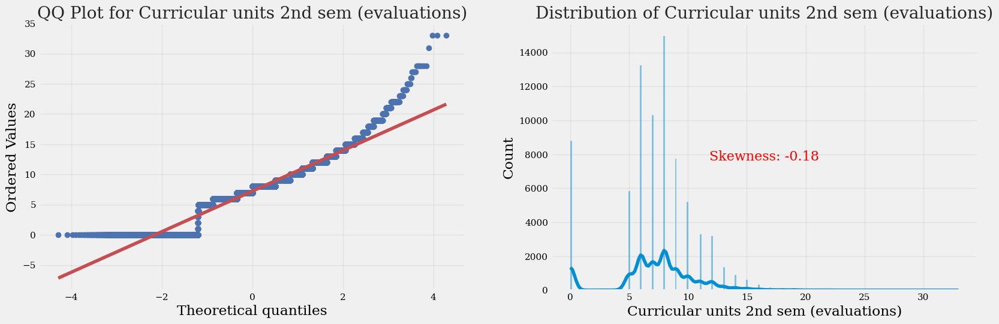

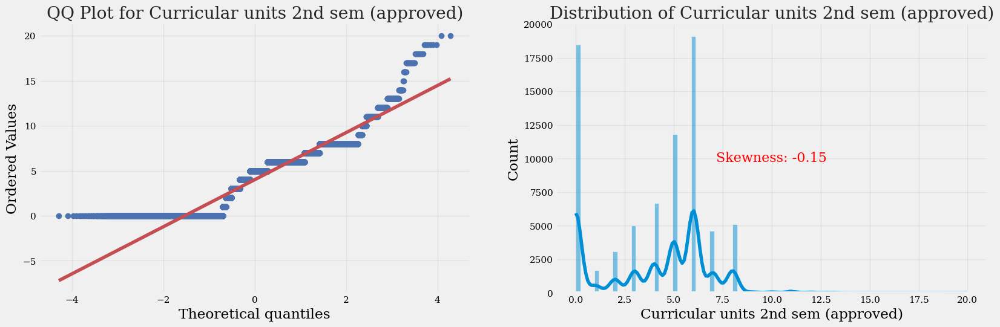

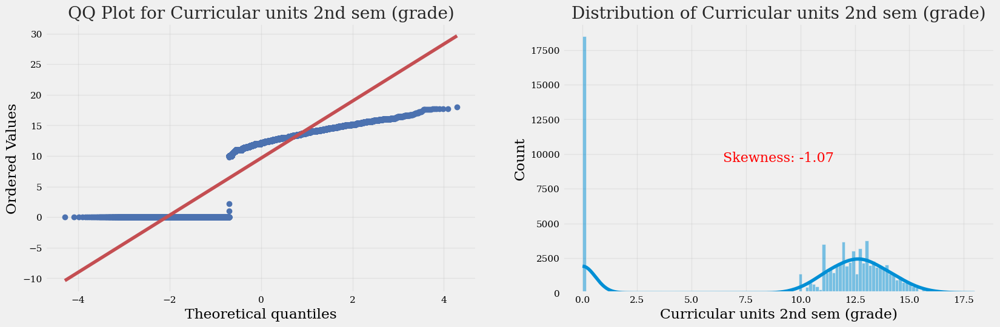

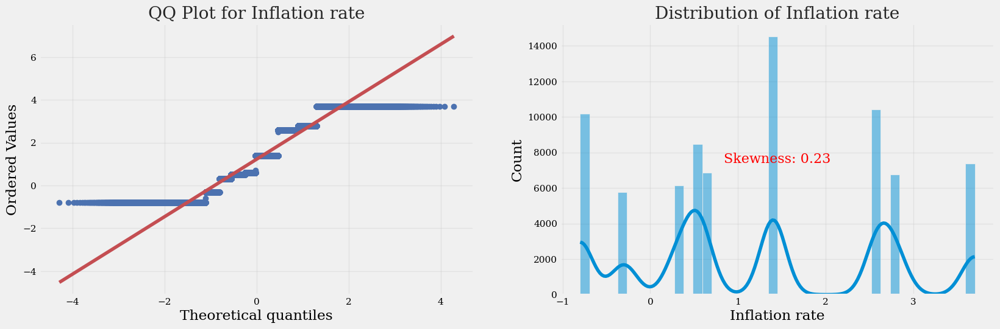

In [18]:
import scipy.stats as stats  
def qq_plot_with_skewness(data, quantitative_var):
    # Check if the variable is present in the DataFrame
    if quantitative_var not in data.columns:
        print(f"Error: '{quantitative_var}' not found in the DataFrame.")
        return
    
    f, ax = plt.subplots(1, 2, figsize=(18, 5.5))

    # Check for missing values
    if data[quantitative_var].isnull().any():
        print(f"Warning: '{quantitative_var}' contains missing values. Results may be affected.")

    # QQ plot
    stats.probplot(data[quantitative_var], plot=ax[0], fit=True)
    ax[0].set_title(f'QQ Plot for {quantitative_var}')

    # Skewness plot
    sns.histplot(data[quantitative_var], kde=True, ax=ax[1])
    ax[1].set_title(f'Distribution of {quantitative_var}')

    # Calculate skewness value
    skewness_value = stats.skew(data[quantitative_var])

    # Display skewness value on the plot
    ax[1].text(0.5, 0.5, f'Skewness: {skewness_value:.2f}', transform=ax[1].transAxes, 
               horizontalalignment='center', verticalalignment='center', fontsize=16, color='red')

    plt.show()
# Example usage for each continuous variable
for var in continuous_vars:
    qq_plot_with_skewness(train, var)

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> 💹OUTLIERS CHECK - BOXPLOT📊</div>

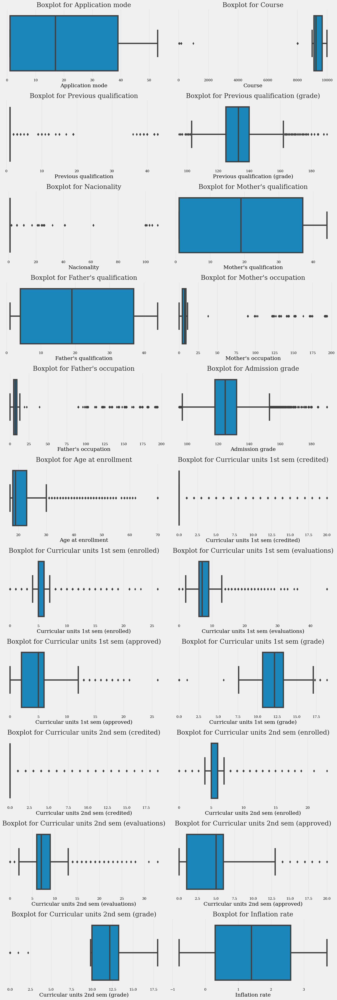

In [19]:
def plot_boxplots(data, columns, ncols=2):
    nrows = (len(columns) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 4 * nrows))

    for i, column in enumerate(columns):
        ax = axes[i // ncols, i % ncols] if nrows > 1 else axes[i % ncols]

        if data[column].dtype == 'O':  # 'O' represents object (categorical) dtype
            sns.countplot(x=column, data=data, ax=ax)
            ax.set_title(f'Countplot for {column}')
        else:
            sns.boxplot(x=column, data=data, ax=ax)
            ax.set_title(f'Boxplot for {column}')

    plt.tight_layout()
    plt.show()

plot_boxplots(train, continuous_vars)

In [20]:
def remove_outliers_replace(data, columns, threshold=1.5):
    data_no_outliers = data.copy()

    for column in columns:
        Q1 = data_no_outliers[column].quantile(0.25)
        Q3 = data_no_outliers[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - threshold * IQR
        upper_bound = Q3 + threshold * IQR

        is_outlier = (data_no_outliers[column] < lower_bound) | (data_no_outliers[column] > upper_bound)

        if data_no_outliers[column].dtype == 'O':  # Categorical column
            median_value = data_no_outliers.loc[~is_outlier, column].mode().iloc[0]
            data_no_outliers.loc[is_outlier, column] = median_value
        else:  # Numerical column
            mean_value = data_no_outliers.loc[~is_outlier, column].mean()
            data_no_outliers.loc[is_outlier, column] = mean_value

    return data_no_outliers

columns_to_remove_outliers_replace = continuous_vars
train = remove_outliers_replace(train, columns_to_remove_outliers_replace)
test = remove_outliers_replace(test, columns_to_remove_outliers_replace)

In [21]:
train.drop(columns='id',axis = 1,inplace = True)

<div class="text_cell_render border-box-sizing rendered_html">
<div class="alert alert-block alert-success" style="margin: 20px; padding: 20px; border-radius: 10px; border: 2px solid #4CAF50; background-color: #FFCCCC;">
    <b>☠ Danger:</b> Before train the model just just convert all the categorical columns 
</div>
</div>

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);"> CONVERT TARGET COLUMN - LABEL ENCODER</div>

In [22]:
from sklearn.preprocessing import LabelEncoder
target_column = 'Target'

# Create a label encoder object
label_encoder = LabelEncoder()

# Fit and transform the target column to convert it to numerical form
train[target_column + '_encoded'] = label_encoder.fit_transform(train[target_column])

In [23]:
# Print the mapping of classes to their assigned numbers
class_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Class to Number Mapping:")
for class_label, class_number in class_mapping.items():
    print(f"{class_label}: {class_number}")

Class to Number Mapping:
Dropout: 0
Enrolled: 1
Graduate: 2


In [24]:
train.sample(5).style.background_gradient()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target,Target_encoded
41620,1,17.000000,4,9147.000000,1,1,125.000000,1,1.000000,19.000000,4.000000,8.000000,121.000000,1,0,0,1,0,0,18.000000,0,0,5.000000,6.000000,5.000000,12.600000,0,0,5.000000,8.000000,5.000000,12.800000,0,10.800000,1.400000,1.740000,Graduate,2
5969,1,17.000000,3,9773.000000,1,1,141.000000,1,1.000000,19.000000,5.000000,5.000000,130.800000,1,0,0,1,0,0,18.000000,0,0,6.000000,6.000000,6.000000,13.333333,0,0,6.000000,7.000000,6.000000,13.571429,0,12.400000,0.500000,1.790000,Graduate,2
10249,1,17.000000,1,9147.000000,1,1,128.000000,1,37.000000,19.000000,9.000000,8.000000,116.500000,0,0,0,1,1,1,18.000000,0,0,5.000000,6.000000,5.000000,11.800000,0,0,5.000000,8.000000,5.000000,11.600000,0,12.700000,3.700000,-1.700000,Graduate,2
51690,1,17.000000,2,9238.000000,1,1,124.000000,1,37.000000,19.000000,8.000000,3.000000,123.300000,1,0,0,1,0,0,20.000000,0,0,6.000000,9.000000,3.000000,12.666667,0,0,6.000000,6.000000,0.000000,12.691529,0,9.400000,-0.800000,-3.120000,Dropout,0
14340,1,39.000000,1,9773.000000,1,1,140.000000,1,37.000000,38.000000,9.000000,9.000000,130.000000,0,0,0,0,0,0,20.122768,0,0,6.000000,12.000000,4.000000,10.750000,0,0,6.000000,10.000000,3.000000,11.333333,0,12.700000,3.700000,-1.700000,Dropout,0


<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">DIVIDING INDEPENDENT AND DEPENDENT COLUMNS</div>

In [25]:
X = train.drop(['Target','Target_encoded'], axis=1)
y = train['Target_encoded']

In [26]:
X.shape, y.shape

((76518, 36), (76518,))

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">🤝CORRELATION🤝</div>

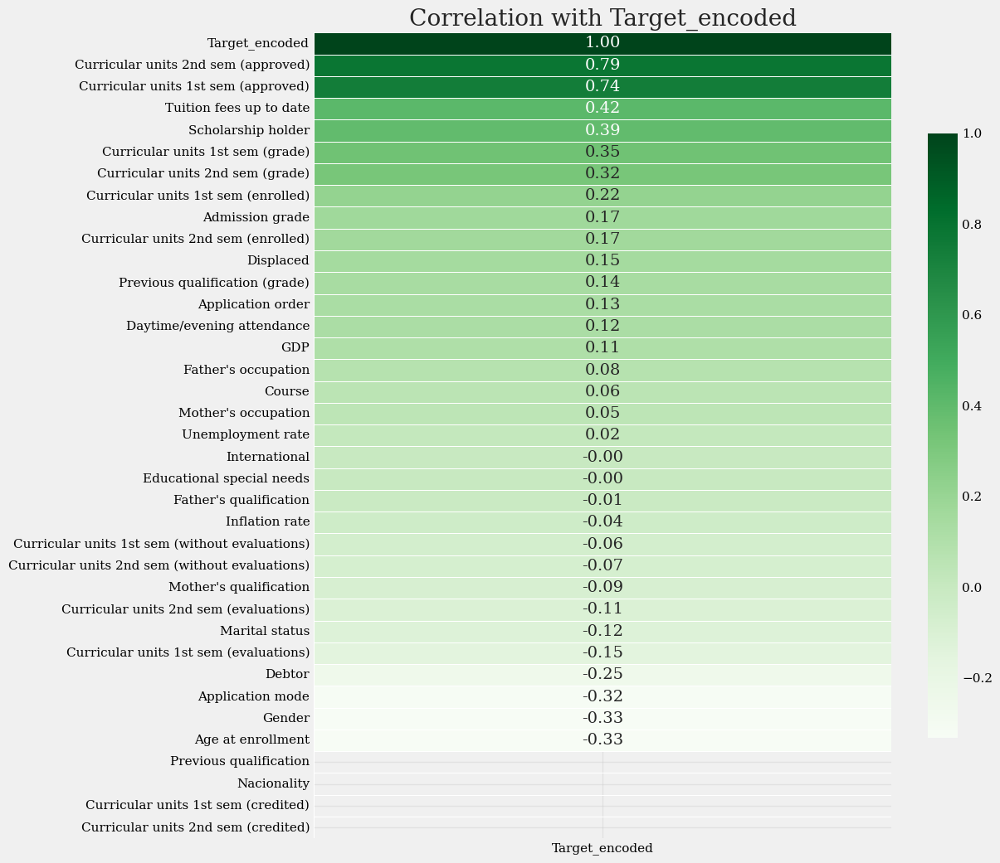

In [27]:
target_encoded_column = target_column + '_encoded'
merged_data = pd.concat([X, train[target_encoded_column]], axis=1)

# Calculate the correlation matrix
correlation_matrix = merged_data.corr()

# To highlight only the Target_encoded column in the heatmap
plt.figure(figsize=(10, 12))
sns.heatmap(correlation_matrix[[target_encoded_column]].sort_values(by=target_encoded_column, ascending=False), annot=True, cmap='Greens', fmt=".2f", linewidths=0.5, cbar_kws={"shrink": 0.75})
plt.title('Correlation with Target_encoded')
plt.show()

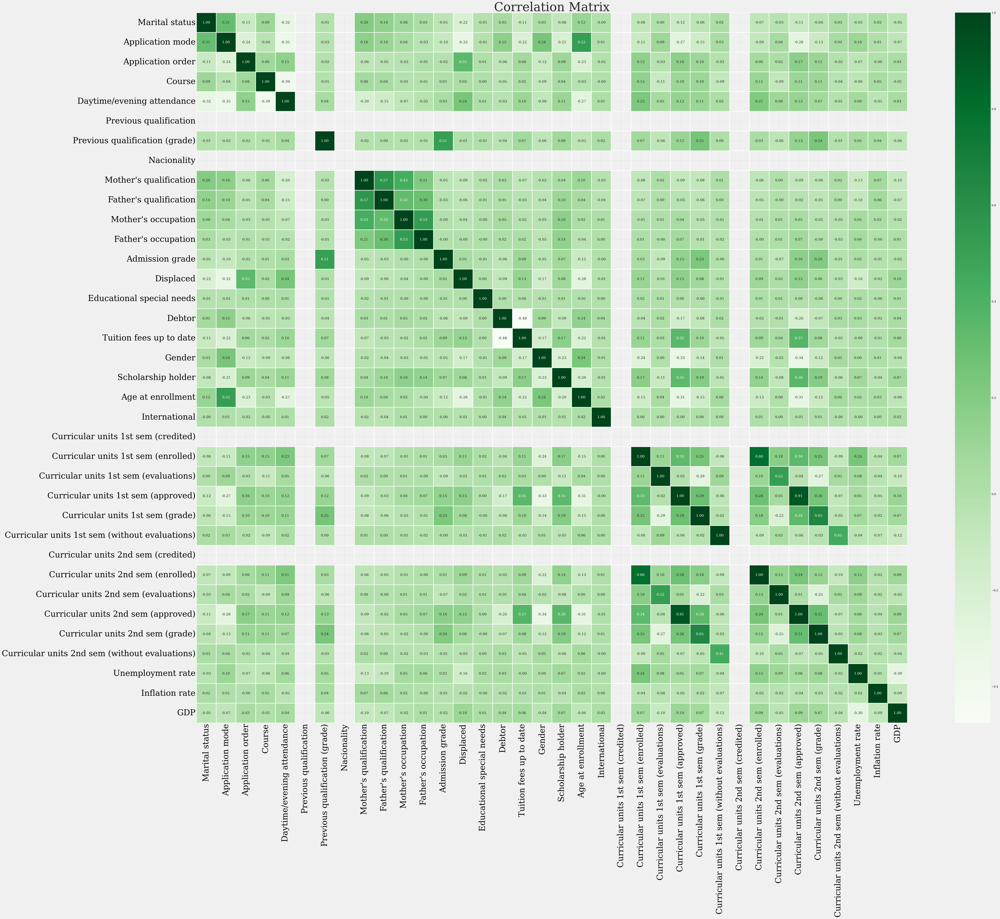

In [28]:
correlation_matrix = X.corr() 

# Set up the matplotlib figure with a larger size
plt.figure(figsize=(60, 48))  # Increase the width and height as needed

# Plot the correlation matrix as a heatmap with larger boxes
sns.heatmap(correlation_matrix, annot=True, cmap='Greens', fmt=".2f", linewidths=2, square=True)

# Customize plot
plt.title('Correlation Matrix', fontsize=48)  # Increase the font size of the title
plt.xticks(fontsize=32)  # Increase the font size of x-axis labels
plt.yticks(fontsize=32)  # Increase the font size of y-axis labels
plt.show()

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">🔥VARIANCE INFLUENCE FACTOR - VIF🔥</div>

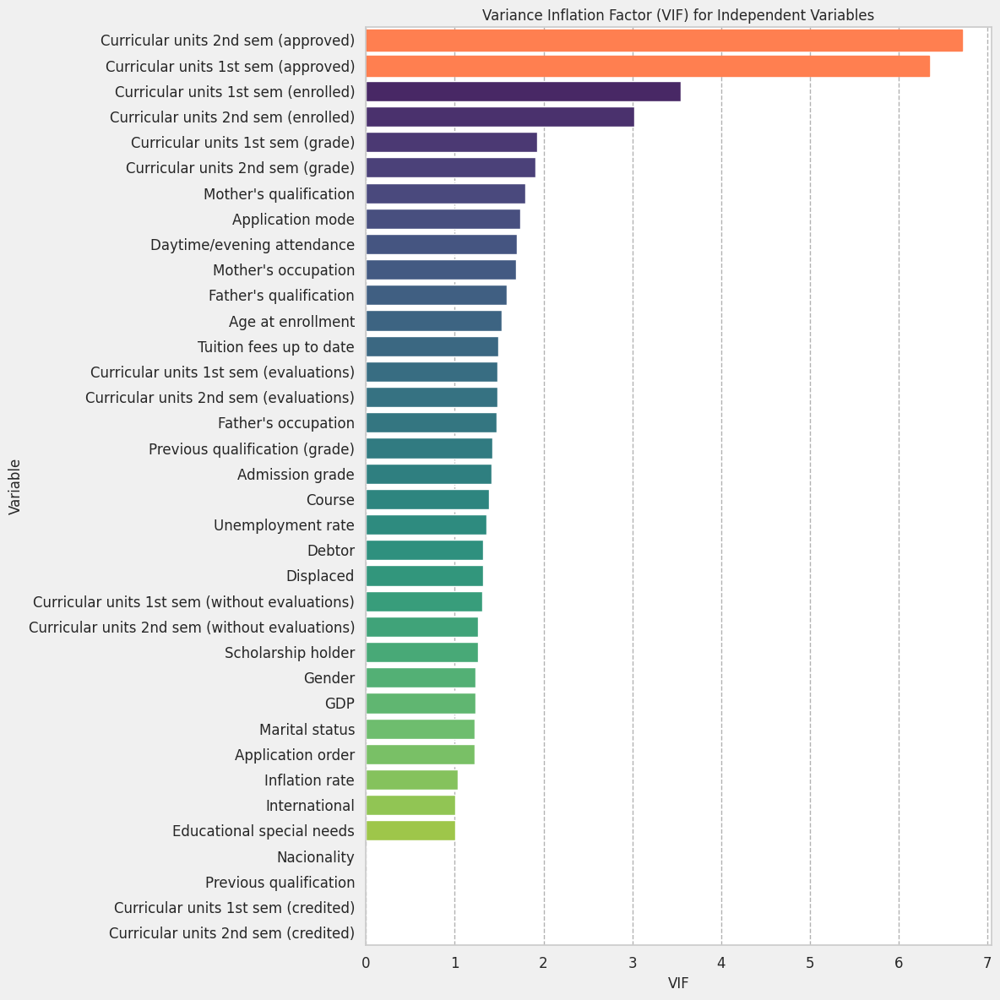

In [29]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Sort the dataframe by VIF values in descending order
vif_data = vif_data.sort_values(by='VIF', ascending=False)

# Set a VIF threshold (e.g., VIF > 5)
vif_threshold = 5

# Identify variables with high VIF that exceed the threshold
high_vif_variables = vif_data[vif_data["VIF"] > vif_threshold]

# Create a beautiful bar plot using Seaborn, highlighting high VIF variables
plt.figure(figsize=(12, 12))
sns.set(style="whitegrid")
plot = sns.barplot(x="VIF", y="Variable", data=vif_data, palette="viridis")

# Highlight high VIF variables
for bar in plot.patches:
    if bar.get_width() > vif_threshold:
        bar.set_color('coral')

plt.xlabel('VIF')
plt.ylabel('Variable')
plt.title('Variance Inflation Factor (VIF) for Independent Variables')
plt.xticks(fontsize=12)  # Increase font size of x-axis ticks
plt.yticks(fontsize=12)  # Increase font size of y-axis ticks
plt.grid(axis='x', linestyle='--', alpha=0.6, color='gray')  # Add grid lines
plt.tight_layout()  # Adjust layout for better appearance
plt.show()

In [30]:
# Display high VIF variables
print("Variables with high VIF (> {}):".format(vif_threshold))
high_vif_variables.style.background_gradient()

Variables with high VIF (> 5):


,Variable,VIF
30,Curricular units 2nd sem (approved),6.713497
24,Curricular units 1st sem (approved),6.340396


In [31]:
train_temp = train.drop(['Target'],axis = 1)

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">🔥HYPOTHESIS TESTING🔥</div>

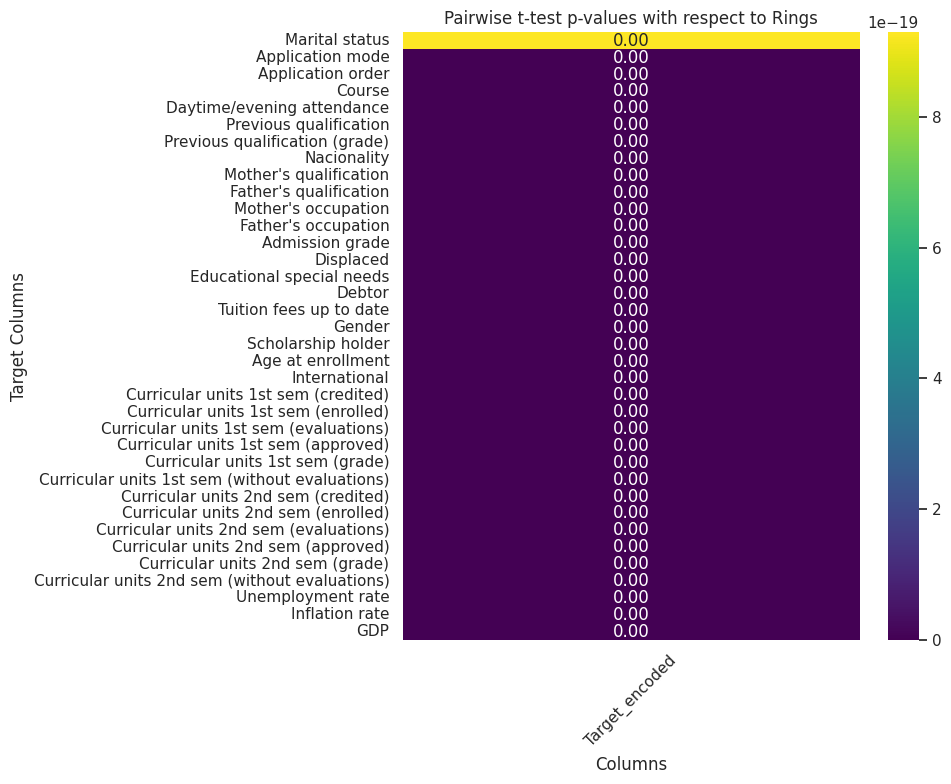

In [32]:
target_columns = ['Target_encoded']

# Perform pairwise t-tests for each target column with all other columns
p_values = {}
for target in target_columns:
    p_values[target] = {}  # Initialize a dictionary for storing p-values for this target
    for column in train_temp.columns:
        if column != target:  # Exclude the target column itself
            t_stat, p_value = ttest_ind(train_temp[target], train_temp[column])
            p_values[target][column] = p_value

# Convert the nested dictionary to a DataFrame for better visualization
p_values_df = pd.DataFrame(p_values)

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(p_values_df, cmap='viridis', annot=True, fmt=".2f")
plt.title('Pairwise t-test p-values with respect to Rings')
plt.xlabel('Columns')
plt.ylabel('Target Columns')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [33]:
print("P-values for Hypothesis Testing:")
p_values_df.style.background_gradient()

P-values for Hypothesis Testing:


,Target_encoded
Marital status,0.000000
Application mode,0.000000
Application order,0.000000
Course,0.000000
Daytime/evening attendance,0.000000
Previous qualification,0.000000
Previous qualification (grade),0.000000
Nacionality,0.000000
Mother's qualification,0.000000
Father's qualification,0.000000


<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">🔥PCA - PRINICIPAL COMPONENT ANALYSIS🔥</div>

![](https://miro.medium.com/v2/resize:fit:1400/1*mgncZaKaVx9U6OCQu_m8Bg.jpeg)

In [34]:
num_samples = len(X)
colors = np.random.rand(num_samples)
X_array = X.values

# Perform PCA
pca = PCA()
pca_result = pca.fit_transform(X_array)

# Set a threshold for explained variance (e.g., 95%)
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
threshold = 0.80

# Find the number of components needed to exceed the threshold
num_components = np.argmax(cumulative_explained_variance >= threshold) + 1

# Create a new DataFrame with principal components as columns
pca_columns = [f'PC{i}' for i in range(1, num_components + 1)]
pca_df = pd.DataFrame(data=pca_result[:, :num_components], columns=pca_columns)

# Display the new DataFrame with principal components
print("DataFrame with Principal Components:")

# Visualize in 3D if there are at least 3 components
if num_components >= 3:
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(pca_df['PC1'], pca_df['PC2'], pca_df['PC3'], c=colors, cmap='viridis', alpha=0.5)
    ax.set_title('PCA Result (3D) with Different Colors')
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    colorbar = fig.colorbar(scatter, ax=ax, pad=0.1)
    colorbar.set_label('Color Label')  # Update with appropriate label

    plt.show()
else:
    print("Number of components is less than 3, unable to visualize in 3D.")
    
pca_df.sample(10).style.background_gradient()

DataFrame with Principal Components:
Number of components is less than 3, unable to visualize in 3D.


,PC1
53467,591.745346
26220,0.030762
59243,-0.106812
38848,-269.329258
12414,-161.145951
74237,100.814035
34941,-161.140798
30533,-314.184139
1141,-329.255258
8381,-161.334608


<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">🔥STANDARDIZATION🔥</div>

![](https://dezyre.gumlet.io/images/blog/feature-scaling-in-machine-learning/Gaussian_Distribution.webp?w=376&dpr=2.6)

In [35]:
X_scale = train.drop(['Target','Target_encoded'], axis=1)
y_scale = train['Target_encoded']

In [36]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()

In [37]:
X_scale_S = ss.fit_transform(X_scale)

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">🔥TRAIN-TEST-SPLIT🔥</div>

![](https://media.licdn.com/dms/image/D4D12AQGDGMjsrzigDg/article-cover_image-shrink_600_2000/0/1674057624735?e=2147483647&v=beta&t=tVSJ36hIjz7sFWVEDRQuvBZxAtFu5JnlCiDpvIuDGI4)

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [39]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_scale_S, y, test_size=0.2, random_state=42)

In [40]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (61214, 36)
y_train shape: (61214,)
X_test shape: (15304, 36)
y_test shape: (15304,)


<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">🔥HYPERTUNING🔥</div>



<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">✨XGBoost OPTUNA || XGBoost Classifier ✨</div>


In [41]:
"""import optuna
def objective(trial, X_train, y_train, X_test, y_test):
    # Define parameters to be optimized for XGBClassifier
    param = {
        "objective": "multi:softmax",  # Use softmax for multi-class classification
        "eval_metric": "mlogloss",  # Multi-class log loss for evaluation
        "verbosity": 0,
        "booster": "gbtree",
        "random_state": 42,
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.05),
        "n_estimators": trial.suggest_int("n_estimators", 100, 600),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0),
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "subsample": trial.suggest_float("subsample", 0.8, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.3, 0.9),
        "min_child_weight": trial.suggest_float("min_child_weight", 1, 10),
    }

    # Create an instance of XGBClassifier with the suggested parameters
    xgb_classifier = XGBClassifier(**param)
    
    # Fit the classifier on the training data
    xgb_classifier.fit(X_train, y_train)

    # Predict on the test data
    y_pred = xgb_classifier.predict(X_test)

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    
    return accuracy

# Assuming X_scale_S is your feature DataFrame and y is your target DataFrame
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scale_S, y, test_size=0.2, random_state=42)  

# Set up the sampler for Optuna optimization
sampler = optuna.samplers.TPESampler(seed=42)  

# Create a study object for Optuna optimization
study = optuna.create_study(direction="maximize", sampler=sampler)  # Use "maximize" for accuracy

# Run the optimization process
study.optimize(lambda trial: objective(trial, X_train, y_train, X_test, y_test), n_trials=100)

# Get the best parameters after optimization
best_params = study.best_params

print('='*50)
print(best_params)"""

'import optuna\ndef objective(trial, X_train, y_train, X_test, y_test):\n    # Define parameters to be optimized for XGBClassifier\n    param = {\n        "objective": "multi:softmax",  # Use softmax for multi-class classification\n        "eval_metric": "mlogloss",  # Multi-class log loss for evaluation\n        "verbosity": 0,\n        "booster": "gbtree",\n        "random_state": 42,\n        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.05),\n        "n_estimators": trial.suggest_int("n_estimators", 100, 600),\n        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),\n        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0),\n        "max_depth": trial.suggest_int("max_depth", 3, 15),\n        "subsample": trial.suggest_float("subsample", 0.8, 1.0),\n        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.3, 0.9),\n        "min_child_weight": trial.suggest_float("min_child_weight", 1, 10),\n    }\n\n    # Create an instance of XGBClass

In [42]:
best_params = {'learning_rate': 0.027219462587283385, 'n_estimators': 575, 'reg_alpha': 0.5182022038793358, 'reg_lambda': 0.11319378661888999, 'max_depth': 7, 'subsample': 0.8327732383706643, 'colsample_bytree': 0.6620112467450039, 'min_child_weight': 5.9709306144718735}

In [43]:
model = XGBClassifier(**best_params)
model.fit(X_scale_S, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6620112467450039, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.027219462587283385,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=5.9709306144718735, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=575,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

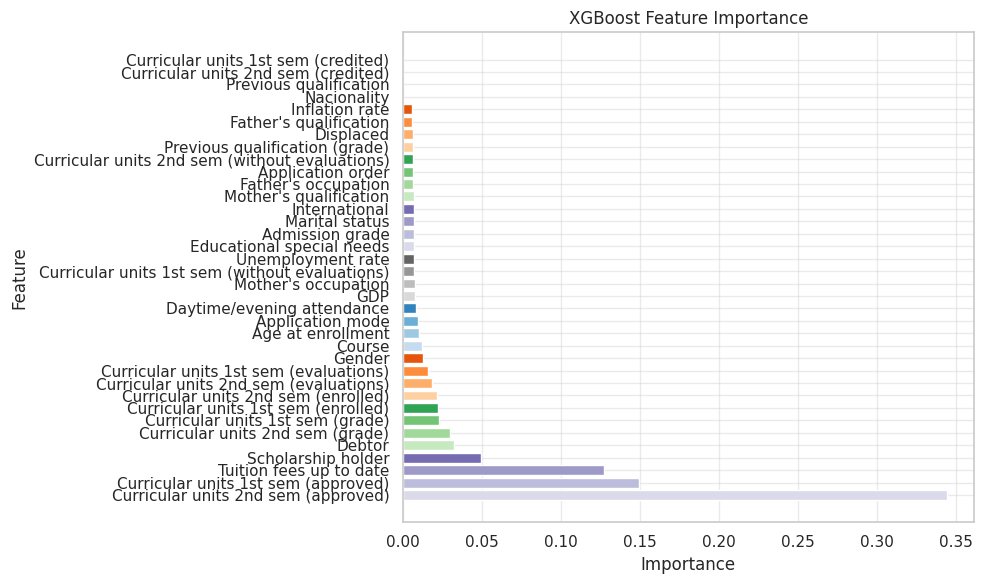

In [44]:
feature_importance = model.feature_importances_
feature_names = X.columns

sorted_indices = feature_importance.argsort()
sorted_importance = feature_importance[sorted_indices]
sorted_features = feature_names[sorted_indices]

plt.figure(figsize=(10, 6))
colors = plt.cm.tab20c.colors[:len(sorted_features)]  
plt.barh(sorted_features, sorted_importance, color=colors)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('XGBoost Feature Importance')
plt.gca().invert_yaxis() 
plt.tight_layout()  
plt.show()

<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">✨CATBoost OPTUNA || CATBoost Classifier ✨</div>


In [45]:
"""def objective(trial, X_train, y_train, X_test, y_test):
    # Define parameters to be optimized for CatBoostClassifier
    param = {
        "objective": "MultiClass",
        "eval_metric": "MultiClass",
        "random_state": 42,
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1),
        "n_estimators": trial.suggest_int("n_estimators", 400, 600),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.3, 0.9),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0),
    }

    # Create an instance of CatBoostClassifier with the suggested parameters
    catboost_classifier = CatBoostClassifier(**param, verbose=0)
    
    # Fit the classifier on the training data
    catboost_classifier.fit(X_train, y_train)

    # Predict on the test data
    y_pred = catboost_classifier.predict(X_test)

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    
    return accuracy

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scale_S, y, test_size=0.2, random_state=42) 

# Set up the sampler for Optuna optimization
sampler = optuna.samplers.TPESampler(seed=42)  

# Create a study object for Optuna optimization
study = optuna.create_study(direction="maximize", sampler=sampler)  # Use "maximize" for accuracy

# Run the optimization process
study.optimize(lambda trial: objective(trial, X_train, y_train, X_test, y_test), n_trials=100)

# Get the best parameters after optimization
best_params = study.best_params

print('='*50)
print(best_params)
"""

'def objective(trial, X_train, y_train, X_test, y_test):\n    # Define parameters to be optimized for CatBoostClassifier\n    param = {\n        "objective": "MultiClass",\n        "eval_metric": "MultiClass",\n        "random_state": 42,\n        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1),\n        "n_estimators": trial.suggest_int("n_estimators", 400, 600),\n        "max_depth": trial.suggest_int("max_depth", 3, 10),\n        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.3, 0.9),\n        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0),\n    }\n\n    # Create an instance of CatBoostClassifier with the suggested parameters\n    catboost_classifier = CatBoostClassifier(**param, verbose=0)\n    \n    # Fit the classifier on the training data\n    catboost_classifier.fit(X_train, y_train)\n\n    # Predict on the test data\n    y_pred = catboost_classifier.predict(X_test)\n\n    # Compute accuracy\n    accuracy = accuracy_score(y_test, y_p

In [46]:
best_params_cat ={'learning_rate': 0.04633466847261269, 'n_estimators': 577, 'max_depth': 6, 'colsample_bylevel': 0.4205278712610268, 'reg_lambda': 0.5780272894391332}

In [47]:
model_cat = CatBoostClassifier(**best_params_cat, verbose=0)
model_cat.fit(X_scale_S, y)

In [48]:
from catboost import CatBoostRegressor, Pool, cv, MetricVisualizer

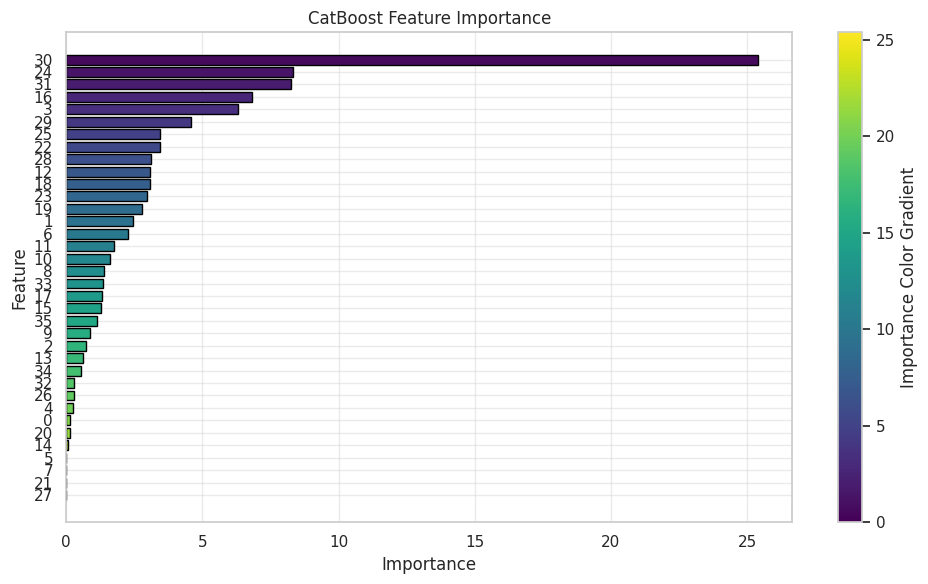

In [49]:
pool = Pool(X_scale_S, y)

# Get feature importance
feature_importance = model_cat.get_feature_importance(pool, type='PredictionValuesChange', prettified=True)

# Sort feature importance values
feature_importance_sorted = feature_importance.sort_values(by='Importances', ascending=False)

# Generate a color gradient for the bars
colors = sns.color_palette("viridis", len(feature_importance_sorted))

# Plot feature importance with customized colors and black border for bars
plt.figure(figsize=(10, 6))
bars = plt.barh(feature_importance_sorted['Feature Id'], feature_importance_sorted['Importances'], color=colors, edgecolor='black')  # Add edgecolor='black' for black borders
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('CatBoost Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important features at the top
plt.tight_layout()  # Adjust layout to prevent cropping

# Add color bar legend
sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array(feature_importance_sorted['Importances'])
cbar = plt.colorbar(sm, orientation='vertical')
cbar.set_label('Importance Color Gradient')

plt.show()


<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">✨LGBM OPTUNA || LGBM Classifier ✨</div>


In [50]:
"""# Define the objective function for Optuna
def objective(trial):
    # Define parameters to be optimized for LightGBM
    params = {
        "objective": "multiclass",  # Use "multiclass" for classification
        "metric": "multi_logloss",  # Use "multi_logloss" for evaluation
        "verbosity": -1,
        "boosting_type": trial.suggest_categorical("boosting_type", ["gbdt", "dart", "goss"]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1),
        "num_leaves": trial.suggest_int("num_leaves", 10, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "min_child_samples": trial.suggest_int("min_child_samples", 1, 20),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0),
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "random_state": 42,
        "num_class": 3,  # Set the number of classes
    }

    # Split the data into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(X_scale_S, y, test_size=0.2, random_state=42)

    # Create a LightGBM Dataset for training and validation
    train_data = lgb.Dataset(X_train, label=y_train)
    val_data = lgb.Dataset(X_val, label=y_val, reference=train_data)

    # Train the LightGBM model
    model = lgb.train(params, train_data, valid_sets=[train_data, val_data], early_stopping_rounds=100)

    # Make predictions on the validation set
    y_pred = model.predict(X_val, num_iteration=model.best_iteration)
    y_pred_max = y_pred.argmax(axis=1)

    # Calculate accuracy as the evaluation metric
    accuracy = accuracy_score(y_val, y_pred_max)

    return accuracy

# Set up the Optuna study
study = optuna.create_study(direction="maximize")  # Use "maximize" for accuracy

# Run the optimization process
study.optimize(objective, n_trials=100)

# Get the best parameters after optimization
best_params = study.best_para"ms

print('='*50)
print(best_params)"""

'# Define the objective function for Optuna\ndef objective(trial):\n    # Define parameters to be optimized for LightGBM\n    params = {\n        "objective": "multiclass",  # Use "multiclass" for classification\n        "metric": "multi_logloss",  # Use "multi_logloss" for evaluation\n        "verbosity": -1,\n        "boosting_type": trial.suggest_categorical("boosting_type", ["gbdt", "dart", "goss"]),\n        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1),\n        "num_leaves": trial.suggest_int("num_leaves", 10, 1000),\n        "max_depth": trial.suggest_int("max_depth", 3, 15),\n        "min_child_samples": trial.suggest_int("min_child_samples", 1, 20),\n        "subsample": trial.suggest_float("subsample", 0.5, 1.0),\n        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),\n        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),\n        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0),\n        "n_estimators": trial.su

In [51]:
#print('Best Parameters:', study.best_params)
"""best_params_lgbm = {'boosting_type': 'gbdt', 
                    'learning_rate': 0.014659319896617274,
                    'num_leaves': 302, 'max_depth': 7,
                    'min_child_samples': 20,
                    'subsample': 0.729207611815592,
                    'colsample_bytree': 0.5372662767641898,
                    'reg_alpha': 0.7606114726137472, 
                    'reg_lambda': 0.4319664094744963,
                    'n_estimators': 766}"""

"best_params_lgbm = {'boosting_type': 'gbdt', \n                    'learning_rate': 0.014659319896617274,\n                    'num_leaves': 302, 'max_depth': 7,\n                    'min_child_samples': 20,\n                    'subsample': 0.729207611815592,\n                    'colsample_bytree': 0.5372662767641898,\n                    'reg_alpha': 0.7606114726137472, \n                    'reg_lambda': 0.4319664094744963,\n                    'n_estimators': 766}"

In [52]:
import warnings
import lightgbm as lgb

# Filter out LightGBM warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [53]:
model_lgbm = LGBMClassifier()
model_lgbm.fit(X, y)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1121
[LightGBM] [Info] Number of data points in the train set: 76518, number of used features: 32
[LightGBM] [Info] Start training from score -1.106880
[LightGBM] [Info] Start training from score -1.633484
[LightGBM] [Info] Start training from score -0.746204


LGBMClassifier()

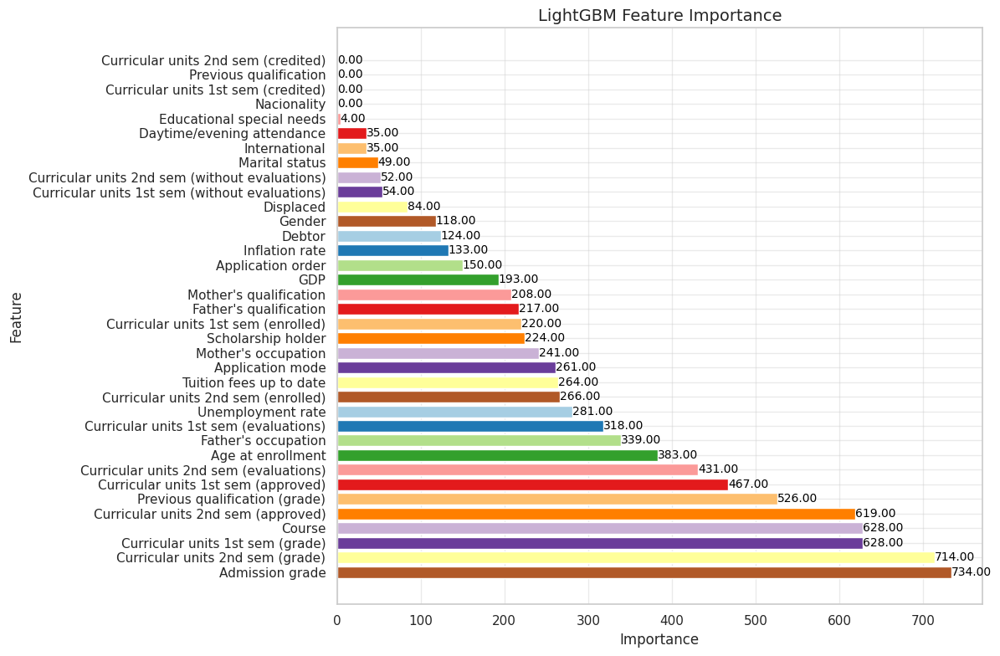

In [54]:
feature_importance = model_lgbm.feature_importances_

feature_names = X.columns

sorted_indices = feature_importance.argsort()
sorted_importance = feature_importance[sorted_indices]
sorted_features = feature_names[sorted_indices]

# Plot feature importance
plt.figure(figsize=(12, 8))
colors = plt.cm.Paired.colors[:len(sorted_features)]  
plt.barh(sorted_features, sorted_importance, color=colors)
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.title('LightGBM Feature Importance', fontsize=14)
plt.gca().invert_yaxis() 

for i, v in enumerate(sorted_importance):
    plt.text(v + 0.02, i, f'{v:.2f}', color='black', va='center', fontsize=10)

plt.tight_layout()  
plt.show()



<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">✨PREDICTION✨</div>


In [55]:
test_pred = test.drop(columns='id',axis = 1)

In [56]:
predictions_xg = model.predict(test_pred)

In [57]:
predictions_xg

array([0, 2, 2, ..., 0, 2, 0])

In [58]:
prediction_catboost = model_cat.predict(test_pred)

In [59]:
prediction_catboost

array([[0],
       [2],
       [2],
       ...,
       [0],
       [2],
       [0]])

In [60]:
prediction_lgbm = model_lgbm.predict(test_pred)

In [61]:
prediction_lgbm

array([0, 2, 2, ..., 0, 0, 0])

In [62]:
pre_submitted_XGBoost = pd.read_csv("/kaggle/input/xgboostsubmission/XGBoost.csv")

In [63]:
pre_submitted_XGBoost.sample(3)

,id,Target
16349,92867,Dropout
17983,94501,Enrolled
11650,88168,Graduate



<div style="color:black; border: 2px solid #6f42c1; background-color:#f3e8ff; padding: 20px; border-radius: 15px; font-size: 200%; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; text-align:center; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.7);">✨PREDICTION CSV FILE SUBMISSION✨</div>


In [64]:
sample_submission = pd.read_csv("/kaggle/input/playground-series-s4e6/sample_submission.csv")

In [65]:
sample_submission.sample(3)

,id,Target
48908,125426,Graduate
43276,119794,Graduate
15294,91812,Graduate


In [66]:
sample_submission['Target'] = predictions_xg

In [67]:
label_mapping = {0: 'Dropout', 1: 'Enrolled', 2: 'Graduate'}
sample_submission['Target'] = sample_submission['Target'].map(label_mapping)

In [68]:
sample_submission.to_csv("XGBoost_Submission.csv",index=False)

In [69]:
sample_submission['Target'] = pre_submitted_XGBoost['Target']

In [70]:
sample_submission.to_csv("Pre-XGBoost_Submission.csv",index=False)

In [71]:
sample_submission['Target'] = prediction_catboost

In [72]:
label_mapping = {0: 'Dropout', 1: 'Enrolled', 2: 'Graduate'}
sample_submission['Target'] = sample_submission['Target'].map(label_mapping)

In [73]:
sample_submission.to_csv("CatBoost_Submission.csv",index=False)

In [74]:
sample_submission['Target'] = prediction_lgbm

In [75]:
label_mapping = {0: 'Dropout', 1: 'Enrolled', 2: 'Graduate'}
sample_submission['Target'] = sample_submission['Target'].map(label_mapping)

In [76]:
sample_submission.to_csv("LGMB_Submission.csv",index=False)

![](https://static.fontget.com/t/h/thank-you/preview@2x.png)